In [20]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load Data

In [2]:
df_data = pd.read_csv('train (6).csv')
df_labels = pd.read_csv('train_churn_labels.csv')

df_data.shape, df_labels.shape

((50000, 230), (50000, 1))

In [3]:
df_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   Label   50000 non-null  int64
dtypes: int64(1)
memory usage: 390.8 KB


In [4]:
df_labels.value_counts(normalize=True)

Label
-1       0.92656
 1       0.07344
Name: proportion, dtype: float64

The labels dataset has two distinct values. We are dealing with **binary classification** problem.

92% of labels belonged to negative class and 8% to positive class. We are dealing with **highly imbalanced dataset**. 

In [5]:
df_data.head()

,Var1,Var2,Var3,Var4,Var5,Var6,Var7,Var8,Var9,Var10,...,Var221,Var222,Var223,Var224,Var225,Var226,Var227,Var228,Var229,Var230
0,NaN,NaN,NaN,NaN,NaN,1526.0,7.0,NaN,NaN,NaN,...,oslk,fXVEsaq,jySVZNlOJy,NaN,NaN,xb3V,RAYp,F2FyR07IdsN7I,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,525.0,0.0,NaN,NaN,NaN,...,oslk,2Kb5FSF,LM8l689qOp,NaN,NaN,fKCe,RAYp,F2FyR07IdsN7I,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,5236.0,7.0,NaN,NaN,NaN,...,Al6ZaUT,NKv4yOc,jySVZNlOJy,NaN,kG3k,Qu4f,02N6s8f,ib5G6X1eUxUn6,am7c,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,...,oslk,CE7uk3u,LM8l689qOp,NaN,NaN,FSa2,RAYp,F2FyR07IdsN7I,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,1029.0,7.0,NaN,NaN,NaN,...,oslk,1J2cvxe,LM8l689qOp,NaN,kG3k,FSa2,RAYp,F2FyR07IdsN7I,mj86,NaN


In [6]:
df_data.dtypes

Var1      float64
Var2      float64
Var3      float64
Var4      float64
Var5      float64
           ...   
Var226     object
Var227     object
Var228     object
Var229     object
Var230    float64
Length: 230, dtype: object

In [7]:
obj_feat = df_data[df_data.columns[df_data.dtypes == 'object']]
num_feat = df_data[df_data.columns[df_data.dtypes != 'object']]

obj_feat.shape, num_feat.shape

((50000, 38), (50000, 192))

In [8]:
obj_feat.columns

Index(['Var191', 'Var192', 'Var193', 'Var194', 'Var195', 'Var196', 'Var197',
       'Var198', 'Var199', 'Var200', 'Var201', 'Var202', 'Var203', 'Var204',
       'Var205', 'Var206', 'Var207', 'Var208', 'Var210', 'Var211', 'Var212',
       'Var213', 'Var214', 'Var215', 'Var216', 'Var217', 'Var218', 'Var219',
       'Var220', 'Var221', 'Var222', 'Var223', 'Var224', 'Var225', 'Var226',
       'Var227', 'Var228', 'Var229'],
      dtype='object')

Non-numeric columns are clustered and occurs as continuous sequence. This invokes a question whether the data is synthetically generated.

### EDA on Numeric Features

The following steps are performed 

- Missing values
- Univariate
- Outliers
- Multivariate
- Handling missing values
- Handling Outliers


**Missing Values**

<AxesSubplot:>

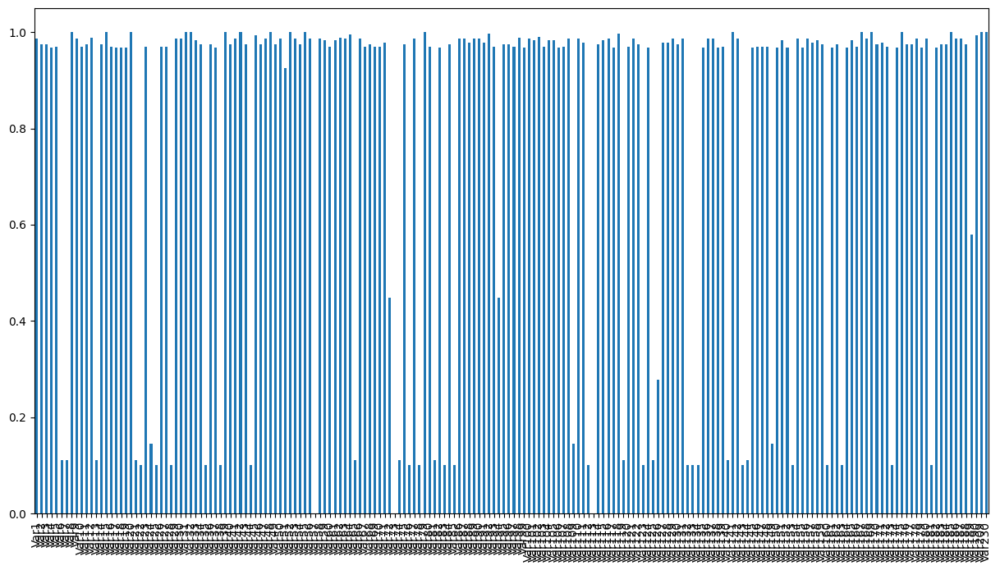

In [9]:
# Missing values
# Plot bar graph to find proportion of missing values for each feature
num_feat.isnull().mean().plot(kind='bar', figsize=(15, 8))

The figures shows a bar plot of proportion of missing values (Y axis) for each feature. It can be seen that dataset is plagued by missing values. And according the paper in Reference [1], for classification problems, it is possible to handle up to 20% of missing values. 

Let's drop the features with more than 20% missing values.

In [10]:
# Drop columns with more than 20% missing values
num_feat_clean = num_feat.loc[:, num_feat.isnull().mean() < .2]
num_feat.shape, num_feat_clean.shape

((50000, 192), (50000, 38))

In [11]:
# find rows where all columns contain missing values
num_feat_clean[num_feat_clean.isnull().all(axis=1)]

,Var6,Var7,Var13,Var21,Var22,Var24,Var25,Var28,Var35,Var38,...,Var134,Var140,Var143,Var144,Var149,Var153,Var160,Var163,Var173,Var181


Dropping the features with more than 20% missing values resulted in 38 numerical features that are qualified for developing a classification model.

**Univariate Analysis**

Lets start by looking into the mean each feature, to understand the scale of values for each feature operates on.

<AxesSubplot:title={'center':'Mean of numerical features'}>

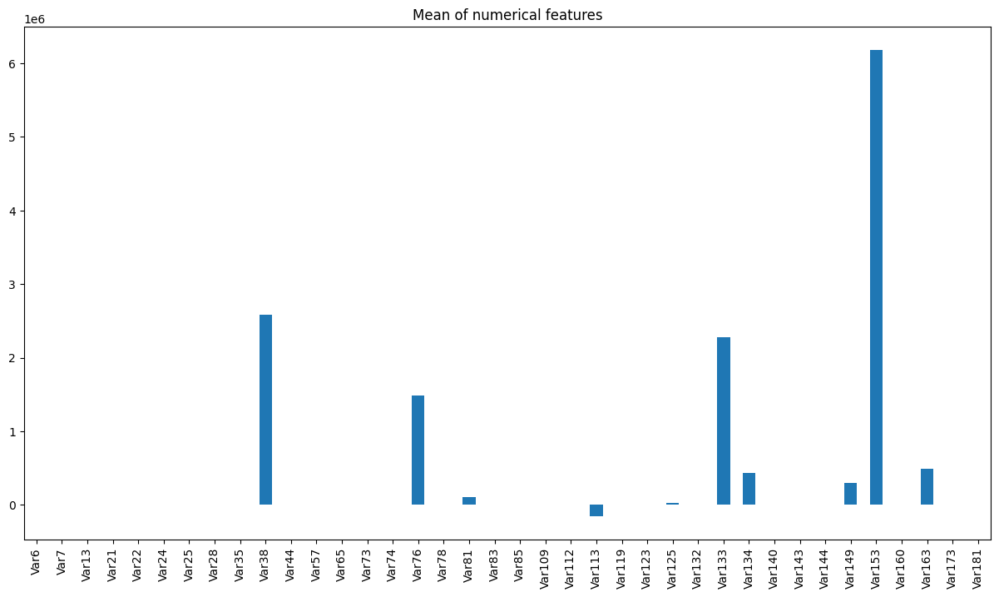

In [12]:
# num_feat_clean.describe()
num_feat_clean.apply(lambda x: x.mean(), axis=0).plot(kind='bar', figsize=(15, 8), title='Mean of numerical features')

This bar plot shows that some features operate on very high scale than others. This suggests that we need to apply re-scaling techniques on the features to makes sure they are on the same scale. 

Variable distributions

array([[<AxesSubplot:title={'center':'Var6'}>,
        <AxesSubplot:title={'center':'Var7'}>,
        <AxesSubplot:title={'center':'Var13'}>,
        <AxesSubplot:title={'center':'Var21'}>,
        <AxesSubplot:title={'center':'Var22'}>,
        <AxesSubplot:title={'center':'Var24'}>],
       [<AxesSubplot:title={'center':'Var25'}>,
        <AxesSubplot:title={'center':'Var28'}>,
        <AxesSubplot:title={'center':'Var35'}>,
        <AxesSubplot:title={'center':'Var38'}>,
        <AxesSubplot:title={'center':'Var44'}>,
        <AxesSubplot:title={'center':'Var57'}>],
       [<AxesSubplot:title={'center':'Var65'}>,
        <AxesSubplot:title={'center':'Var73'}>,
        <AxesSubplot:title={'center':'Var74'}>,
        <AxesSubplot:title={'center':'Var76'}>,
        <AxesSubplot:title={'center':'Var78'}>,
        <AxesSubplot:title={'center':'Var81'}>],
       [<AxesSubplot:title={'center':'Var83'}>,
        <AxesSubplot:title={'center':'Var85'}>,
        <AxesSubplot:title={'center':'V

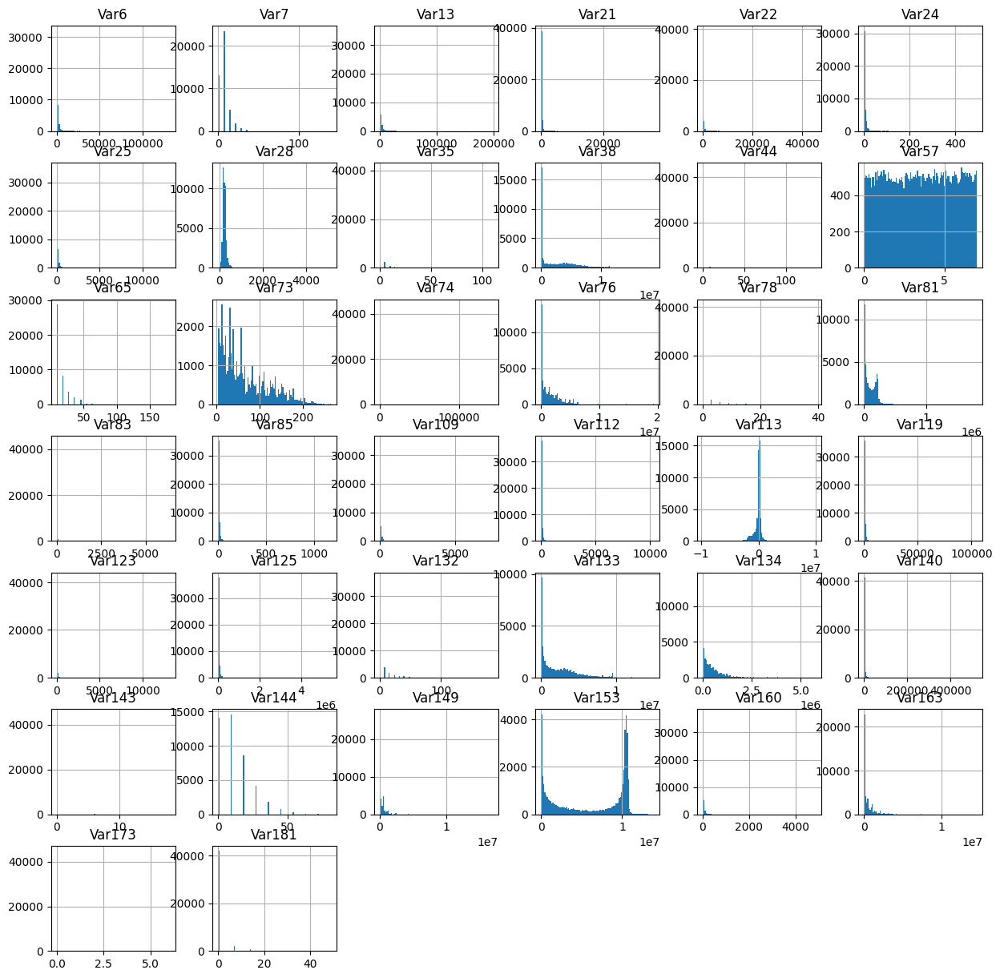

In [13]:
# plot histogram for numerical feature
num_feat_clean.hist(bins=100, figsize=(15, 15))
sns.histplot(data=num_feat_clean, bins=100, kde=True, palette='Set2')


The plot reveals some interesting facts about data. 
- None of the features is normally distributed. 
- Var113 is only feature close to normal.
- Var57 is uniformly distributed
- Few of features seems to take only few values. These may come from categorical features encoded numerically. 

Let's examine the number of unique values present in these features.

array([[<AxesSubplot:title={'center':'Var6'}>,
        <AxesSubplot:title={'center':'Var7'}>,
        <AxesSubplot:title={'center':'Var13'}>,
        <AxesSubplot:title={'center':'Var21'}>,
        <AxesSubplot:title={'center':'Var22'}>,
        <AxesSubplot:title={'center':'Var24'}>],
       [<AxesSubplot:title={'center':'Var25'}>,
        <AxesSubplot:title={'center':'Var28'}>,
        <AxesSubplot:title={'center':'Var35'}>,
        <AxesSubplot:title={'center':'Var38'}>,
        <AxesSubplot:title={'center':'Var44'}>,
        <AxesSubplot:title={'center':'Var57'}>],
       [<AxesSubplot:title={'center':'Var65'}>,
        <AxesSubplot:title={'center':'Var73'}>,
        <AxesSubplot:title={'center':'Var74'}>,
        <AxesSubplot:title={'center':'Var76'}>,
        <AxesSubplot:title={'center':'Var78'}>,
        <AxesSubplot:title={'center':'Var81'}>],
       [<AxesSubplot:title={'center':'Var83'}>,
        <AxesSubplot:title={'center':'Var85'}>,
        <AxesSubplot:title={'center':'V

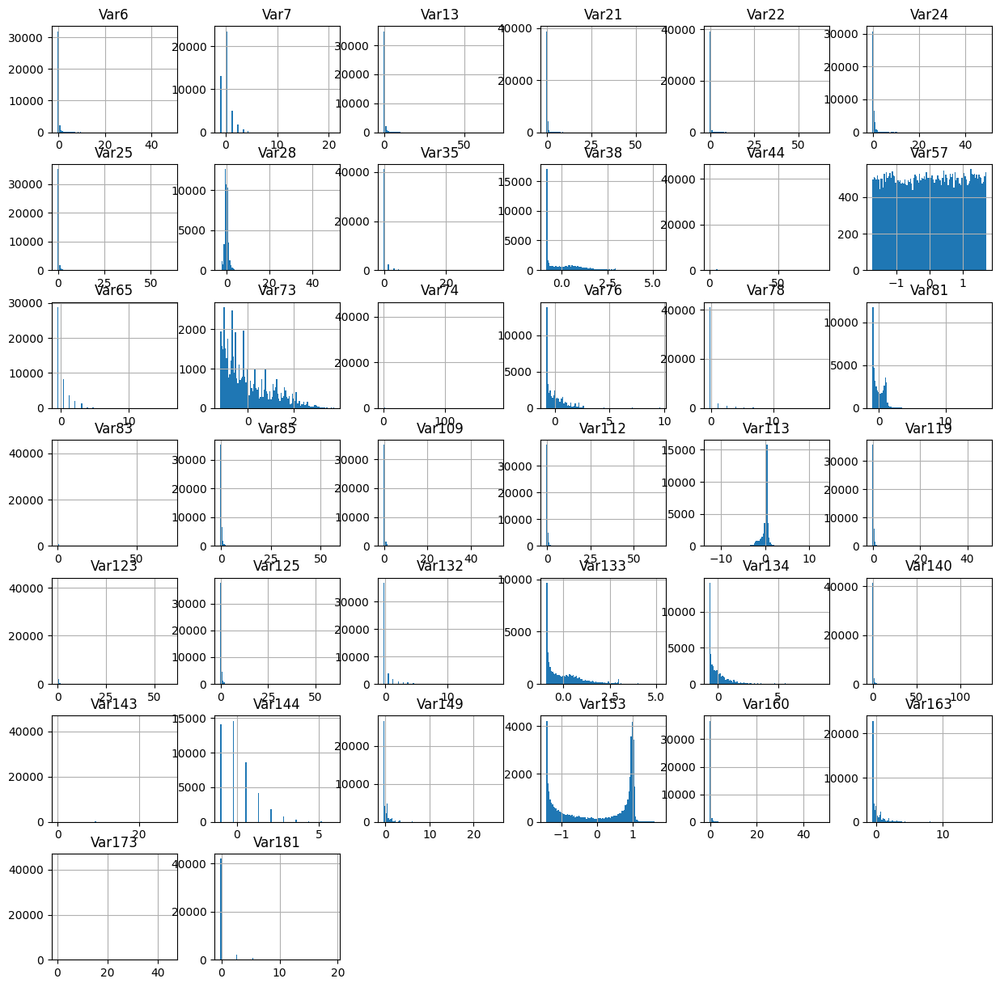

In [14]:
# standardize numerical features
df1=(num_feat_clean - num_feat_clean.mean()) / num_feat_clean.std()

# from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()
# df2 = pd.DataFrame(data=scaler.fit_transform(num_feat_clean), columns=num_feat_clean.columns)

# # compare both results
# df1.equals(df2)

df1.hist(bins=100, figsize=(15, 15))

The dataset contains 50,000 data points. It's fair to make an assumption, **the features that has less than 20 unique values are categorical**.

Lets apply the criteria and separate these features.

In [16]:
# check categorical nature of numerical feature.
num_feat_clean.nunique()#.plot(kind='bar', figsize=(15, 8))

# concervatively we can assume that features with less than 20 unique values are categorical
num_cat_feat_clean = num_feat_clean.loc[:, num_feat_clean.nunique() <= 20]#.nunique().plot(kind='bar', figsize=(15, 8))
num_feat_clean = num_feat_clean.loc[:, num_feat_clean.nunique() > 20]
num_cat_feat_clean.shape, num_feat_clean.shape


((50000, 10), (50000, 28))

Outliers

We will use the Inter Quartile Range (IQR) for analysing the outlier in the dataset.

$$IQR = Q3 - Q1$$

Q3 = the 75th percentile value (it is the middle value between the median and the largest value inside a dataset). Q1 = the 25th percentile value

We can use the Box-plot to Analyse this

<AxesSubplot:>

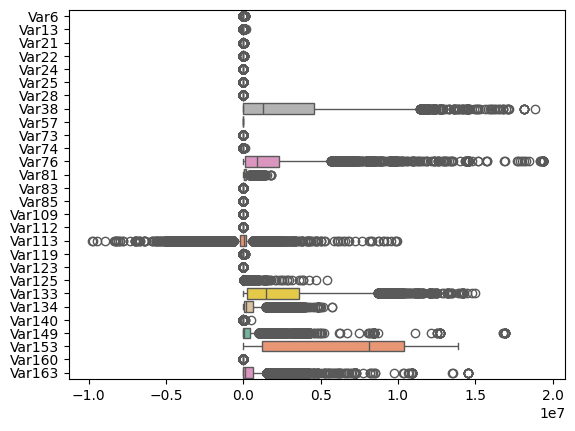

In [18]:
sns.boxplot(data=num_feat_clean, orient='h', palette='Set2')

Box plot shows the data has outliers. The presence of outliers is high on several features such as Var113, Var76 etc.

Correlation analysis

Correlation shows the strength and direction of relationships between numerical data. Pearson correlation coefficient is the method to compute the correlation between two continuous variables.

We compute the correlation between each numerical features. The result is in the form of matrix, where each element in matrix is the pearson correlation coefficient computed between row variable and column variable. This result correlation matrix is plotted as heatmap for the purpose of analysis. 


<AxesSubplot:>

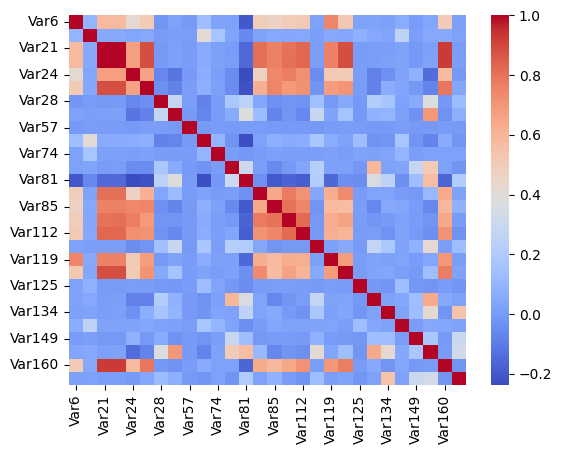

In [24]:
sns.heatmap(num_feat_clean.corr(), fmt='.2f', cmap='coolwarm')

The diagonals elements exhibit strong correlation as it's correlation with the same variable. 

We can observer few red shaded region which shows the cluster of variables that are co-related. 

Pair Plot

/home/owl/.pyenv/versions/3.9.19/lib/python3.9/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/owl/.pyenv/versions/3.9.19/lib/python3.9/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/owl/.pyenv/versions/3.9.19/lib/python3.9/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/owl/.pyenv/versions/3.9.19/lib/python3.9/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/owl/.pyenv/versions/3.9.19/lib/python3.9/site-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/home/owl/.pyenv/ver

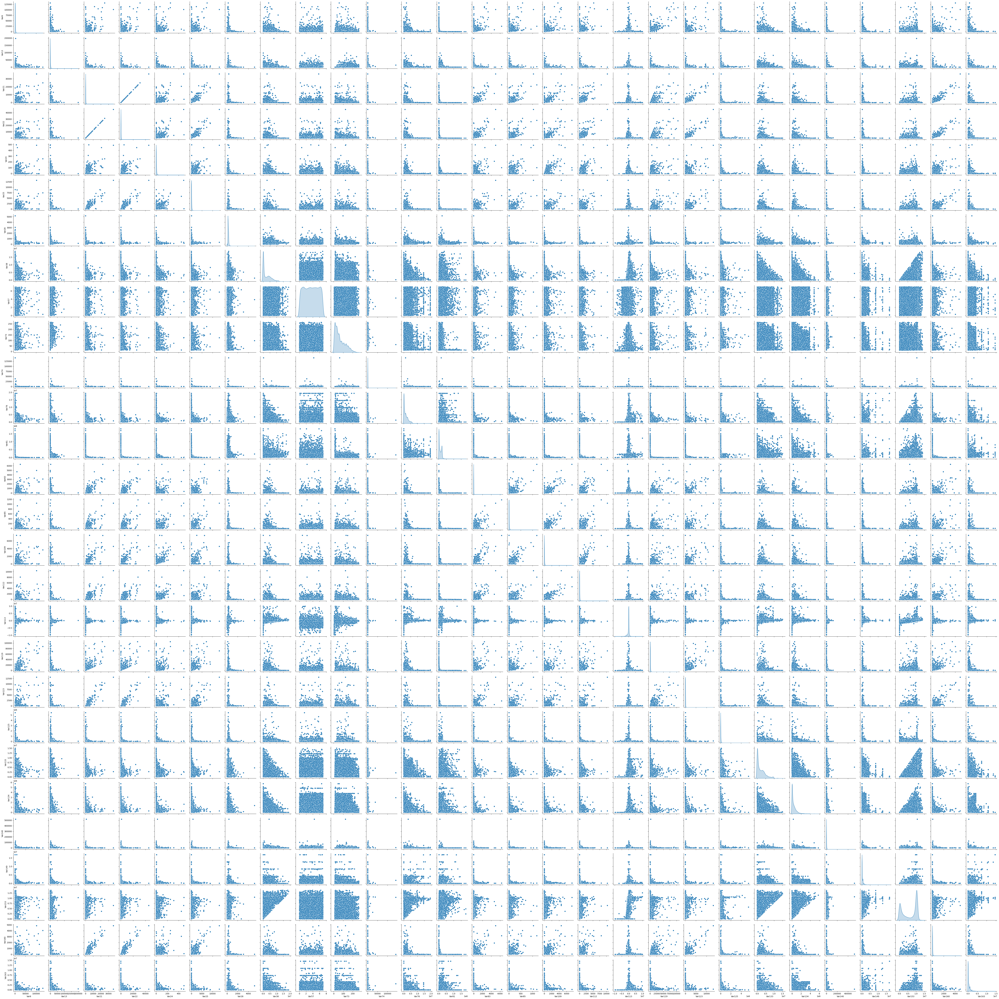

In [25]:
sns.pairplot(num_feat_clean, diag_kind='kde', palette='Set2')

### EDA on non-numeric data

In this section we shall explore the non-numeric columns

In [21]:
obj_feat.shape

(50000, 38)

### Missing values

Examine the proportion of missing values for each feature

<AxesSubplot:>

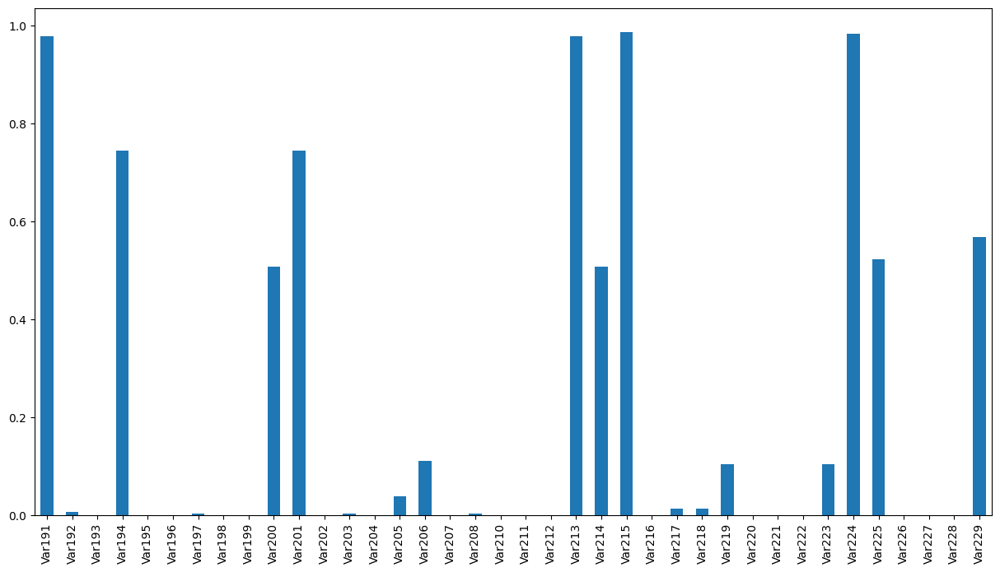

In [27]:
obj_feat.isna().mean().plot(kind='bar', figsize=(15, 8))

Many non-numeric features has very high proportion of missing values. Applying the same rule as numeric for handling missing values. Drop the features with more than 20% missing values.

In [28]:
obj_feat_clean = obj_feat.loc[:, obj_feat.isna().mean() < .2]
obj_feat.shape, obj_feat_clean.shape

((50000, 38), (50000, 28))

**Unique values**

Analyze the number of unique values for each feature.

<AxesSubplot:title={'center':'Proportion of unique values in categorical features'}>

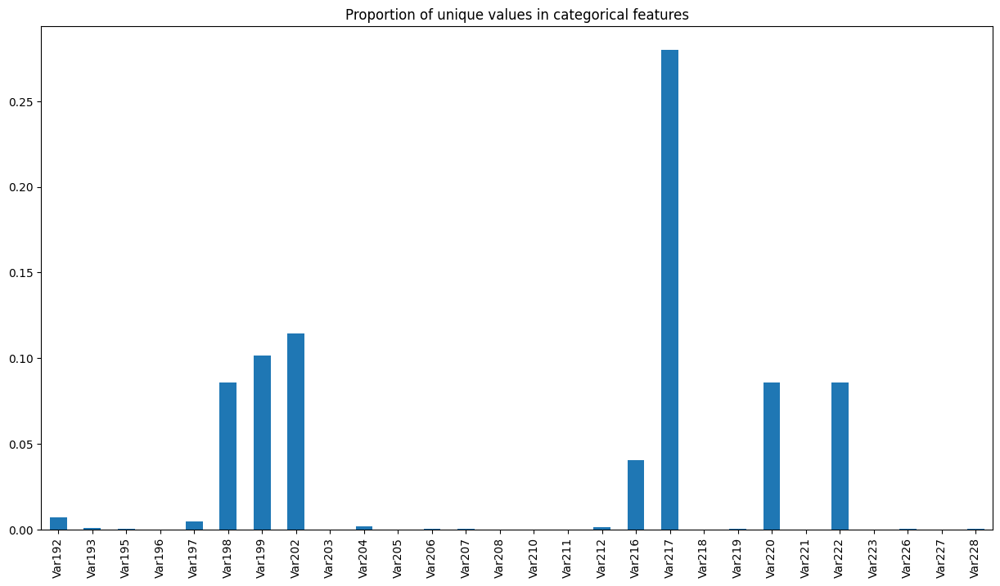

In [34]:
(obj_feat_clean.nunique()/len(obj_feat_clean)).plot(kind='bar', figsize=(15, 8), title='Proportion of unique values in categorical features')

Several non-numeric feature has very large number of unique values, these cannot be attributed as categorical feature. Treating such feature as categories and applying one-hot encoding would result in the number additional columns as features. Increasing the dimensions is usually results in bad model performance.

In [39]:
obj_feat_act_clean = obj_feat_clean.loc[:, (obj_feat_clean.nunique()<=20)]
obj_feat_clean.shape, obj_feat_act_clean.shape

((50000, 28), (50000, 11))